In [44]:
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt

import missingno as msno
import seaborn as sns
sns.set_theme(style="whitegrid")

%matplotlib inline

Url of the dataset: https://www.kaggle.com/competitions/house-prices-advanced-regression-techniques/

In [45]:
train = pd.read_csv('data/housing/train.csv')
test = pd.read_csv('data/housing/test.csv')

In [46]:
# Have a quick look at data
train.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


## Variable understanding

In [47]:
# Check size of the train dataset
print("Number of rows: ", train.shape[0])
print("Number of columns: ", train.shape[1])

Number of rows:  1460
Number of columns:  81


We have 1460 rows and 80 features plus the target variable SalePrice

In [62]:
# Divide into numerical and categorical columns
numerical_columns = [col for col in train.columns if train[col].dtype in ['int64', 'float64']]

categorical_columns = [col for col in train.columns if train[col].dtype == "object"]

In [71]:
print("Number of numerical columns: ", len(numerical_columns))
print("Number of categorical columns: ", len(categorical_columns))
print("Checking division of columns: ", train.shape[1] == len(numerical_columns) + len(categorical_columns))

Number of numerical columns:  38
Number of categorical columns:  43
Checking division of columns:  True


## Missing values

In [72]:
# Obtain number of null values and percentage
def get_missing_values(df):
    missing_values = df.isnull().sum().to_frame('number_missing_values').reset_index().rename(columns={'index': 'column'})
    missing_values["percentage"] = missing_values.number_missing_values / df.shape[0]
    
    return missing_values

In [74]:
missing_values = get_missing_values(train)
missing_values[missing_values.number_missing_values >  0]

,column,number_missing_values,percentage
3,LotFrontage,259,0.177397
6,Alley,1369,0.937671
25,MasVnrType,8,0.005479
26,MasVnrArea,8,0.005479
30,BsmtQual,37,0.025342
31,BsmtCond,37,0.025342
32,BsmtExposure,38,0.026027
33,BsmtFinType1,37,0.025342
35,BsmtFinType2,38,0.026027
42,Electrical,1,0.000685


## Duplicate values

In [75]:
train[train.duplicated()]

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice


In [76]:
train.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,...,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,...,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,...,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,...,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,...,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,...,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


### Summary

The train dataset has the following characteristics:

* 1460 rows and 80 columns
* 38 numerical and 43 categorical columns
* Has missing values
* No duplicate value

## Univariate analysis

First, we check the target variable to understand its distribution.

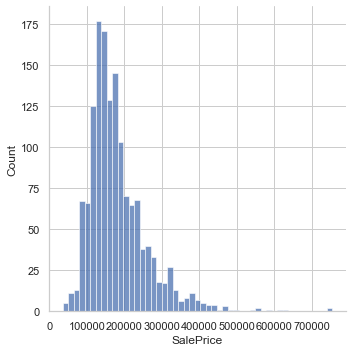

In [77]:
sns.displot(train['SalePrice']);

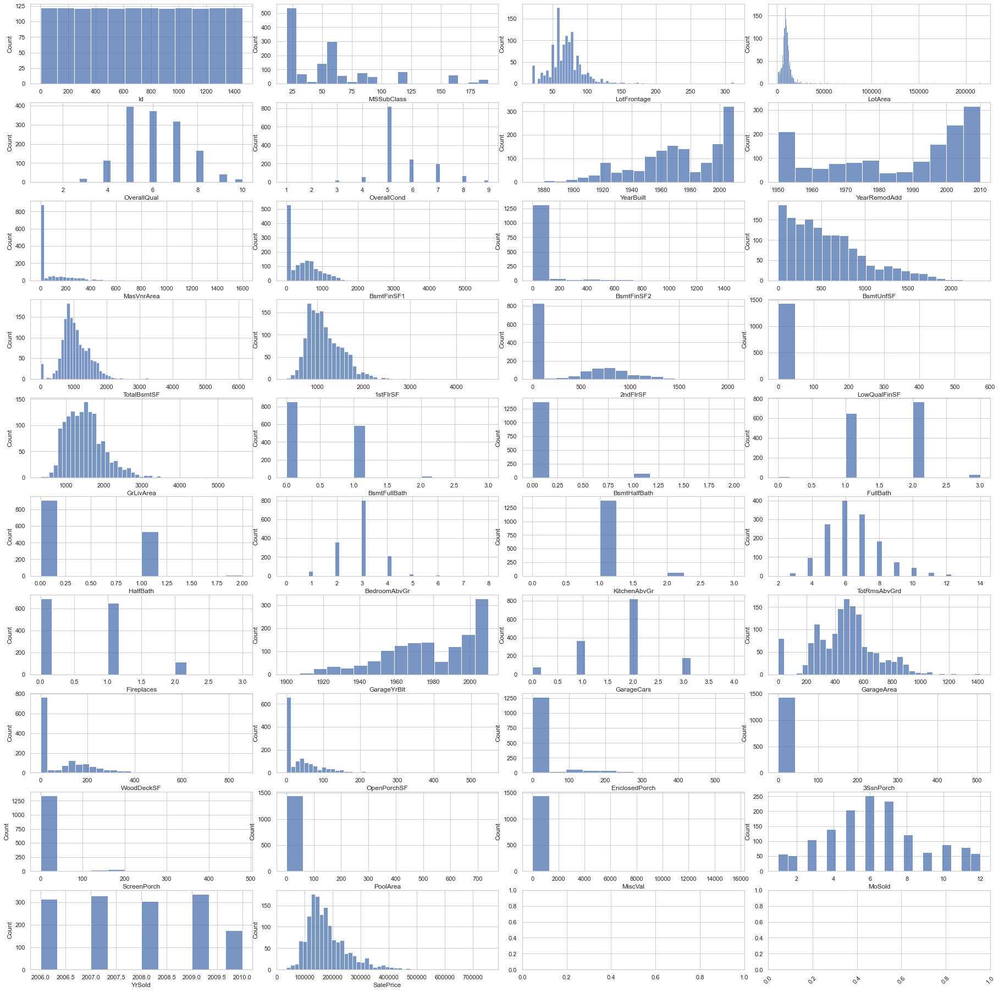

In [100]:
# Check the distribution of numerical variables

n_rows = 10
n_cols = 4

fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(25,25))
plt.tight_layout()

for i, col in enumerate(train[numerical_columns].columns):
    sns.histplot(train[col], ax=axes[i//n_cols,i%n_cols])
    plt.xticks(rotation = 45)

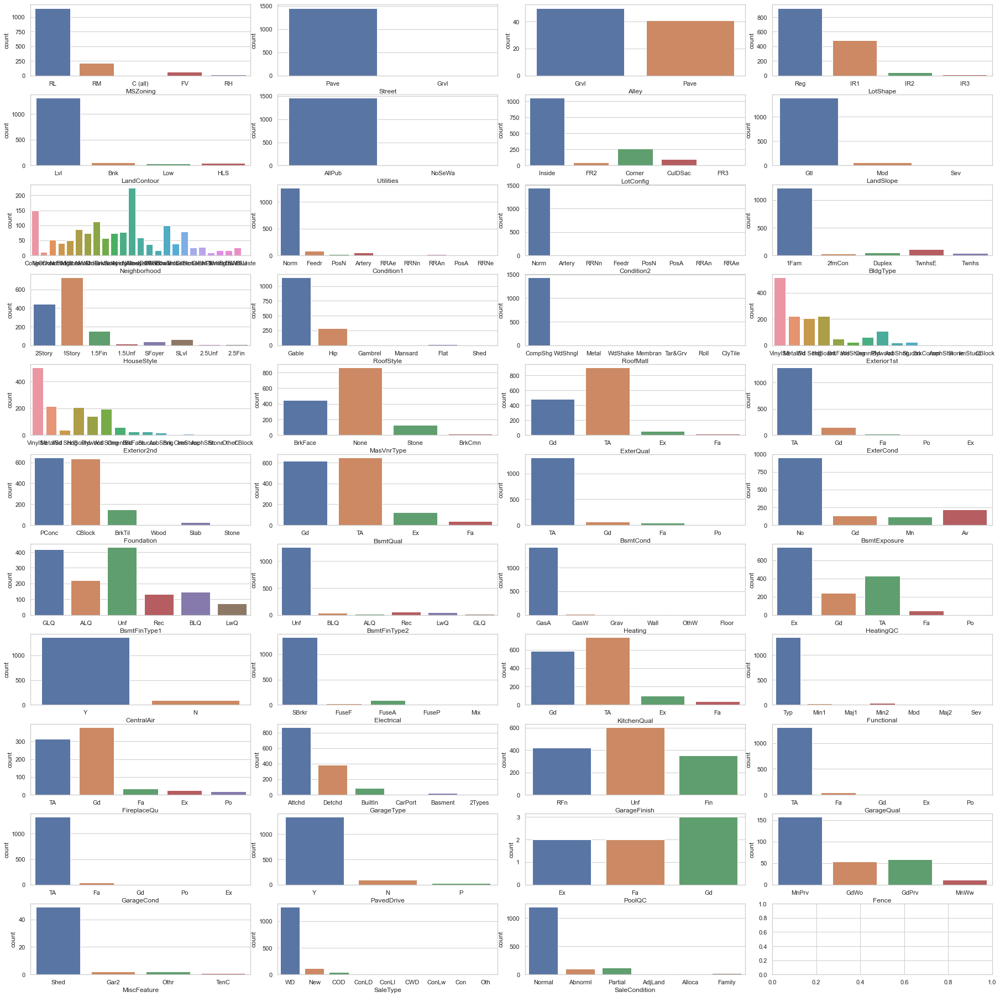

In [106]:
# Check the distribution of categorical variables

n_rows = 11
n_cols = 4

fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(25,25))
plt.tight_layout()

for i, col in enumerate(train[categorical_columns].columns):
    sns.countplot(x=col, data=train, ax=axes[i//n_cols,i%n_cols])
    
    #chart.set_xticklabels(chart.get_xticklabels(), rotation=45)

## Bivariate analysis

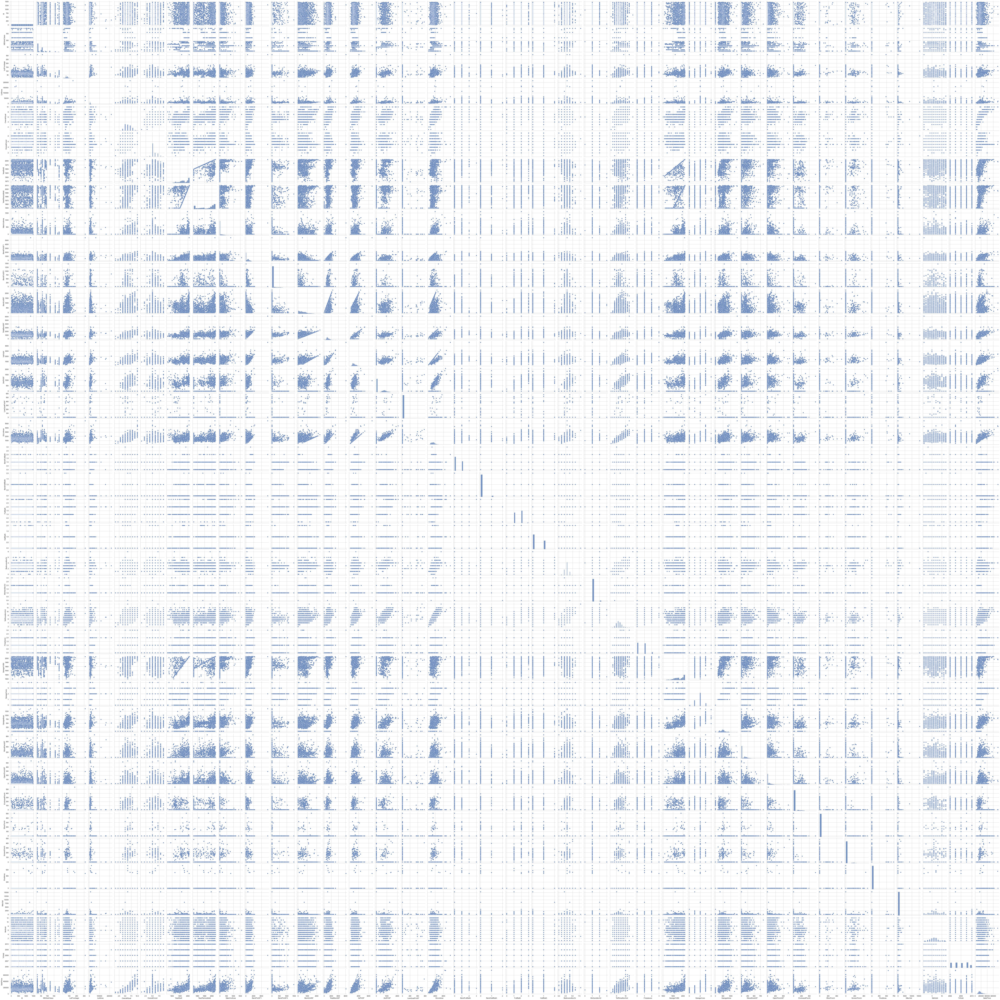

In [107]:
sns.pairplot(train[numerical_columns])

## Correlations

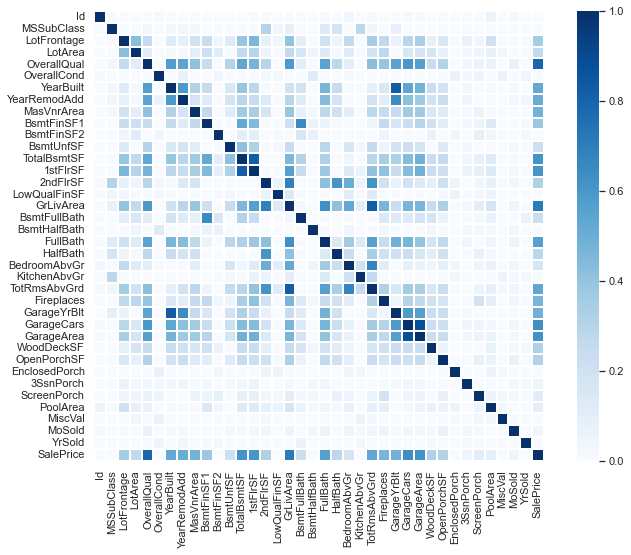

In [109]:
corr = train[numerical_columns].corr()
fig, ax = plt.subplots()
fig.set_size_inches(11.7, 8.27)
sns.heatmap(corr, vmin=0, vmax=1, linewidths=2, square=True, cmap='Blues');